In [1]:
%load_ext autoreload

%autoreload 2

# Figure 3: Myeloids

In [2]:
import scanpy as sc
import pandas as pd
import numpy as np
import anndata
import joblib
import matplotlib.pyplot as plt
from tqdm.auto import tqdm
import seaborn as sns
from plotnine import *
import scvelo as scv
import scipy as sp

In [3]:
sc.set_figure_params()
scv.set_figure_params(vector_friendly=False)

In [4]:
sc.settings.figdir = 'figure'
scv.settings.figdir = 'figure'

In [5]:
from pathlib import Path

sys.path.append(str(Path.home() / 'Code/sctoolkit')) #https://github.com/gokceneraslan/sctoolkit/

In [6]:
from sctoolkit.specificity import get_gene_specificity_metricsv2
from sctoolkit.sctransform import sctransform
from sctoolkit.utils import run_spring, dotplot_spring, sort_by_correlation, plot_significance_dotplot
from sctoolkit.revigo import revigo
from sctoolkit.proportions import plot_proportion_barplot, dirichletreg, plot_proportion_barplot_with_ncells, get_proportions_per_channel

In [31]:
ad = sc.read('myeloids.h5ad')
ad.shape

(14156, 16150)

## PAGA and UMAP

saving figure to file figure/scvelo_Figure3A.pdf


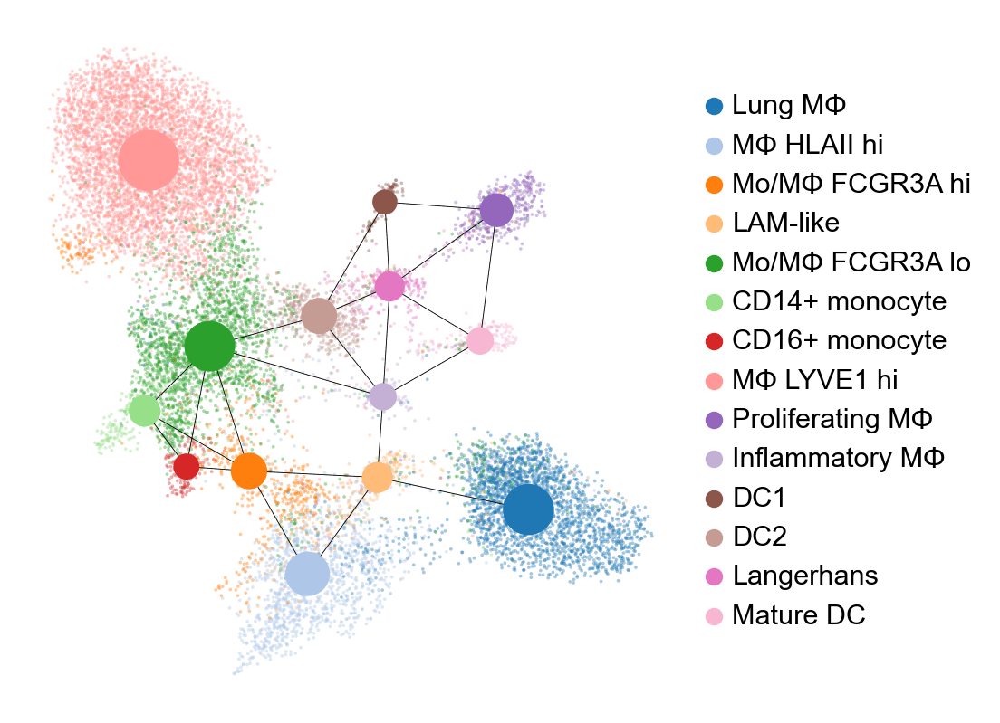

In [32]:
import scvelo as scv

sc.tl.paga(ad, 'annotation')

scv.pl.paga(ad, basis='umap', threshold=0.4, max_edge_width=0.3, alpha=.4, title='', save='Figure3A.pdf', 
            figsize=(4.7,5), legend_loc='right margin')
#scv.pl.paga(ad, basis='umap', threshold=0.4, max_edge_width=0.4, alpha=.5, color='Tissue')

## Markers

In [33]:
markers = {
    'Lung MΦ': 
    [
        'PPARG',
        'SLC11A1',
        'EML4',
    ],
    'MΦ HLAII hi': 
    [
        'APOE',
        'APOC1',
        'HLA-DRA',
    ],
    'Mo/MΦ FCGR3A hi': 
    [
        'S100A6',
        'S100A4',
        'CD68',
        'HLA-DRB1',
    ],    
    'LAM-like':
    [
        'SPP1',
        'FABP5',
        'CD9',
        'TREM2',
    ],     
    'Mo/MΦ FCGR3A lo': 
    [
        'VCAN',
        'FCN1',
    ],    
    'CD14+ monocyte': 
    [
        'S100A8',                        
        'VCAN',        
        'FAM65B',
        'FCN1',
    ],
    'CD16+ monocyte': 
    [
        'LILRB1',        
        'FCGR3A',
        'LILRB2',
    ],
    'MΦ LYVE1 hi': 
    [
        'F13A1',
        'SEPP1',
        'LYVE1',
    ],
    'Proliferating MΦ': 
    [
        'TOP2A',
        'MKI67',
        'UBE2C',        
    ],
    'Inflammatory MΦ': 
    [
        'IL1B',
        'CCL4L2',
        'CCL4',
        'CXCL8',
    ],    
    'DC1': 
    [
        'C1orf186',        
        'CLEC9A',
        'XCR1',        
    ],    
    'DC2': 
    [
        'IL18R1',
        'IL1R2',
        'CD1C', 
        'CLEC10A',        
    ],
    'Langerhans': 
    [
        'RUNX3',        
        'CD207',
        'CD1A',        

    ],
    'Mature DC': 
    [
        'CCR7',
        'LAMP3',
        'BIRC3',
    ],

}

In [34]:
ad.obs['annotation'].cat.reorder_categories(markers.keys(), inplace=True)

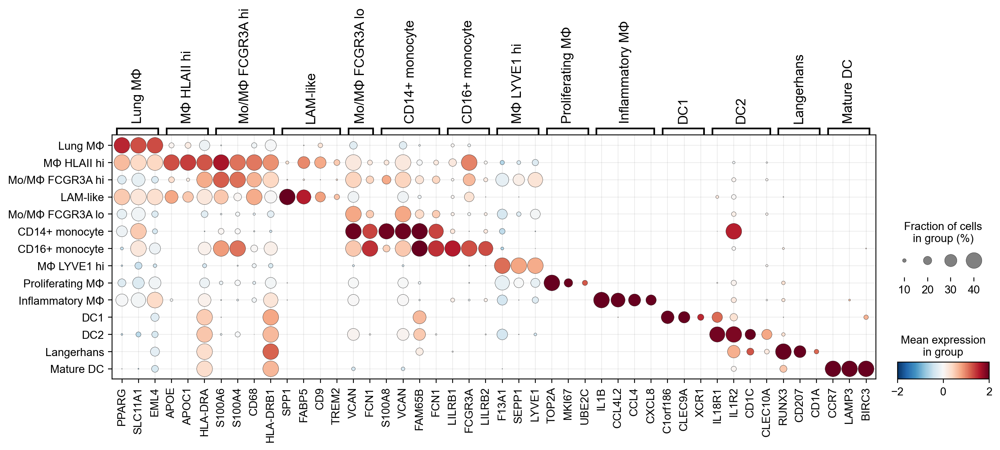

In [35]:
f = sc.pl.dotplot(ad, markers, groupby='annotation', layer='scaled', vmin=-2, vmax=2, cmap='RdBu_r', return_fig=True, figsize=(14,4))
f.style(grid=True, cmap='RdBu_r', dot_max=.4, dot_min=.05, x_padding=0.6, y_padding=0.6)
f.savefig('figure/Figure3B.pdf')

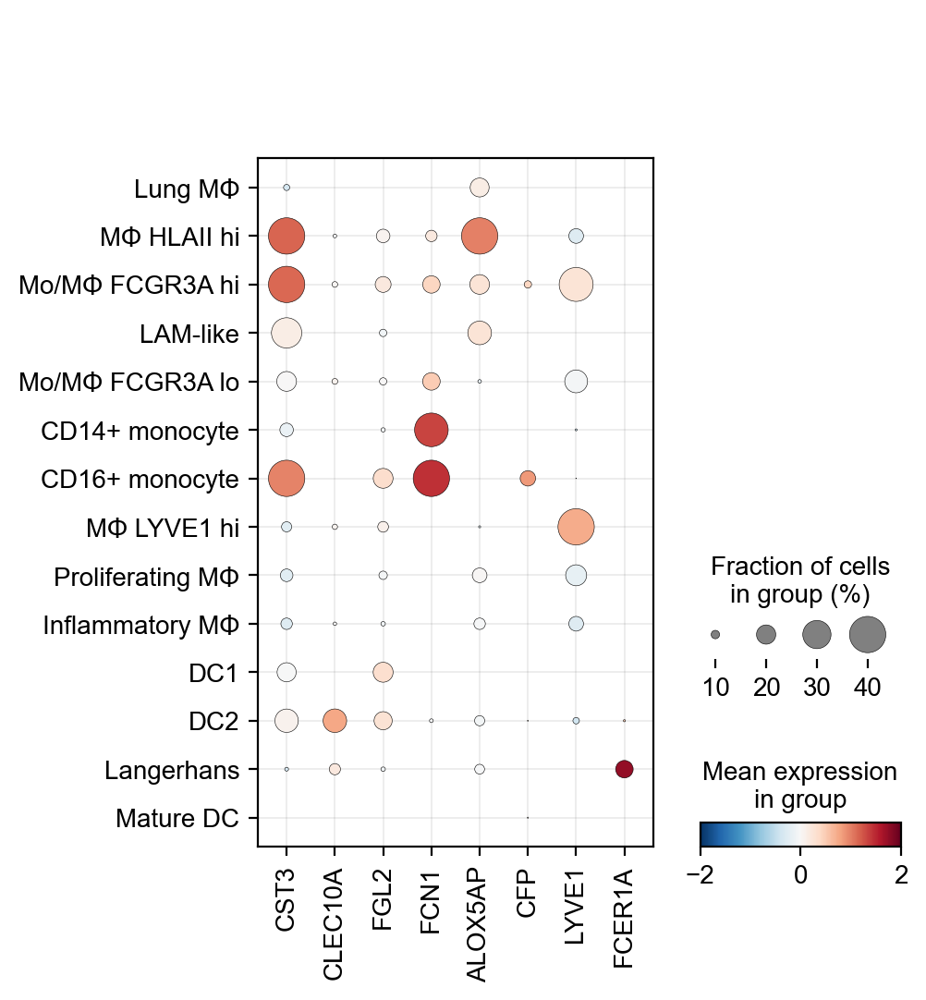

In [36]:
f = sc.pl.dotplot(ad, ['CST3', 'CLEC10A', 'FGL2', 'FCN1', 'ALOX5AP', 'CFP', 'LYVE1', 'FCER1A'], groupby='annotation', layer='scaled', vmin=-2, vmax=2, cmap='RdBu_r', return_fig=True)
f.style(grid=True, cmap='RdBu_r', dot_max=.4, dot_min=.05, x_padding=0.6, y_padding=0.6)
f.show()

## Alveolar score

In [37]:
sc.tl.score_genes(ad, ['MRC1', 'ITGAX', 'PPARG', 'FABP4', 'FABP5', 'CLEC7A', 'LGALS3', 'MARCO'], score_name='Alv. MΦ score', use_raw=False)

In [38]:
sc.set_figure_params()

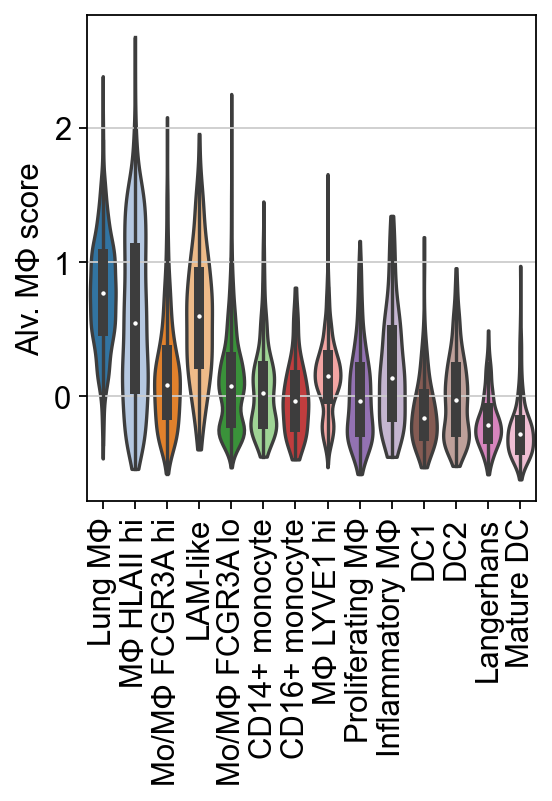

In [40]:
sc.pl.violin(ad, 'Alv. MΦ score', 'annotation', inner='box', rotation=90, stripplot=False, save='Figure-S11-C-upper.pdf')

## LAM score

In [41]:
sc.tl.score_genes(ad, ['SPP1', 'CHIT1', 'PLA2G7', 'LIPA', 'FABP5', 'FABP4', 'TREM2', 'CTSB', 'CTSL', 'CTSD', 'CD9'], score_name='LAM score', use_raw=False)

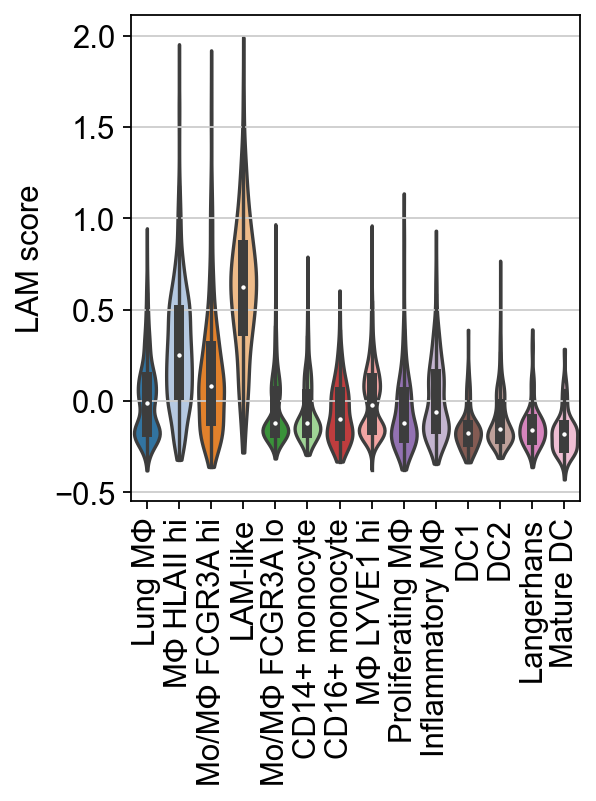

In [42]:
sc.pl.violin(ad, 'LAM score', 'annotation', inner='box', rotation=90, stripplot=False, save='Figure-S11-C-lower.pdf')

## Proportions

In [33]:
pd.crosstab(ad.obs.Tissue, ad.obs.annotation, normalize=1)*100

annotation,Lung MΦ,MΦ HLAII hi,Mo/MΦ FCGR3A hi,LAM-like,Mo/MΦ FCGR3A lo,CD14+ monocyte,CD16+ monocyte,MΦ LYVE1 hi,Proliferating MΦ,Inflammatory MΦ,DC1,DC2,Langerhans,Mature DC
Tissue,,,,,,,,,,,,,,
Breast,0.0,0.298730,0.518135,16.961131,1.454234,0.000000,1.470588,2.131018,7.600950,2.976190,0.900901,1.268116,0.000000,0.000000
E. mucosa,0.0,1.867065,2.936097,2.120141,8.810950,11.464968,8.088235,7.142857,14.014252,22.023810,24.324324,12.318841,76.587302,63.905325
E.muscularis,0.0,0.597461,7.599309,1.060071,11.548332,3.184713,5.147059,24.526440,16.389549,23.214286,17.117117,17.753623,1.190476,1.775148
Heart,0.0,32.486931,53.195164,20.848057,53.079555,49.681529,57.352941,53.591160,33.491686,13.690476,23.423423,31.340580,0.793651,10.650888
Lung,100.0,54.070202,11.398964,31.095406,14.542344,15.286624,8.823529,3.255722,15.914489,31.547619,17.117117,5.797101,0.000000,11.834320
Prostate,0.0,10.306199,19.170984,25.795053,4.362703,12.420382,11.029412,0.236780,6.175772,5.357143,4.504505,9.420290,0.396825,2.958580
Sk. muscle,0.0,0.373413,5.181347,0.706714,5.260907,7.961783,8.088235,8.524073,3.800475,1.190476,11.711712,13.768116,0.000000,0.591716
Skin,0.0,0.000000,0.000000,1.413428,0.940975,0.000000,0.000000,0.591949,2.612827,0.000000,0.900901,8.333333,21.031746,8.284024


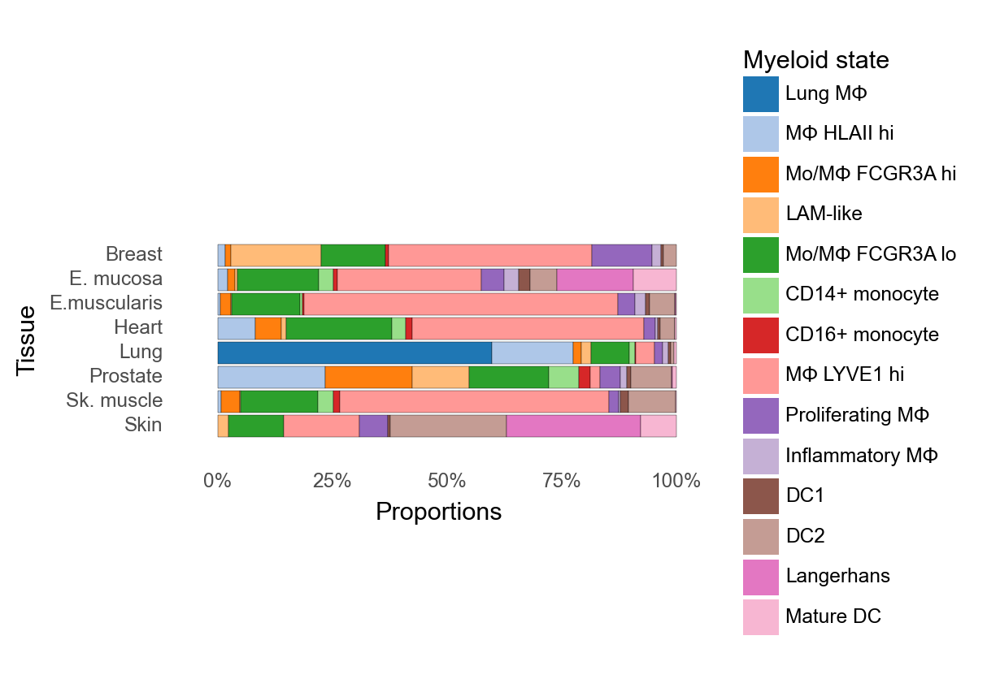

<ggplot: (8793434156282)>

In [34]:
g = plot_proportion_barplot(ad, 'Tissue', fill='annotation', fill_label='Myeloid state', fill_breakdown='Tissue',width_scale=0.5, height_scale=0.5, show_percent=False)
ggsave(g, 'figure/Figure3C-upper.pdf')
g

In [35]:
ad.obs['ind_tissue'] = ad.obs.Tissue.astype(str) + '-' + ad.obs.participant_id.astype(str)

In [36]:
ad.obs['sample_tissue'] = ad.obs.Tissue.astype(str)+ '-' + ad.obs.prep.astype(str) + '-' + ad.obs.individual.astype(str) 

In [37]:
ad.obs['prep_ind'] = ad.obs.prep.astype(str) + '-' + ad.obs.individual.astype(str) 

In [38]:
ad._sanitize()

... storing 'ind_tissue' as categorical
... storing 'sample_tissue' as categorical
... storing 'prep_ind' as categorical


In [39]:
it = ad.obs.ind_tissue.value_counts()>20
it = it[it].index

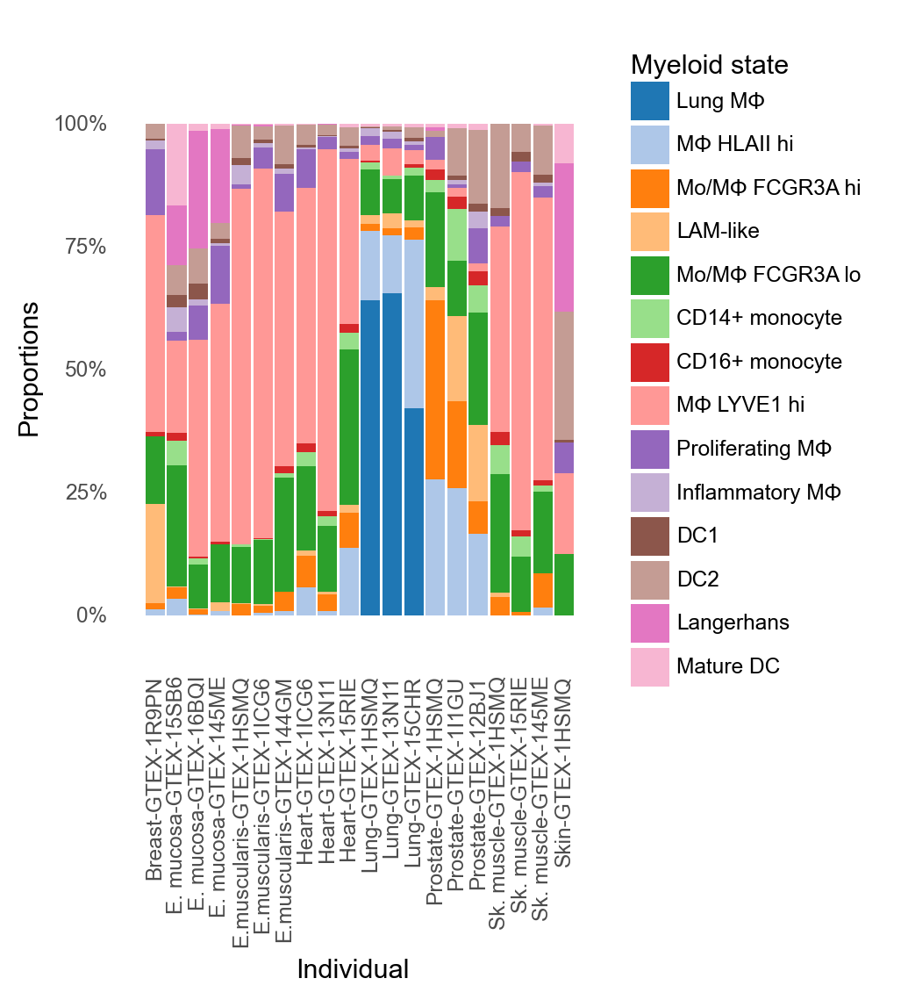

<ggplot: (8793434184343)>

In [40]:
g = plot_proportion_barplot(
    ad[ad.obs.ind_tissue.isin(it)],
    'ind_tissue',
    fill='annotation',
    legend_position=(1.2,0.5), 
    fill_label='Myeloid state',
    percent_limit=5,
    width_scale=0.5,
    height_scale=0.4, 
    show_percent=False, 
    yaxis_label='Individual',
    swap_axes=True,
)
g

In [41]:
st = ad.obs.sample_tissue.value_counts()>20
st = st[st].index

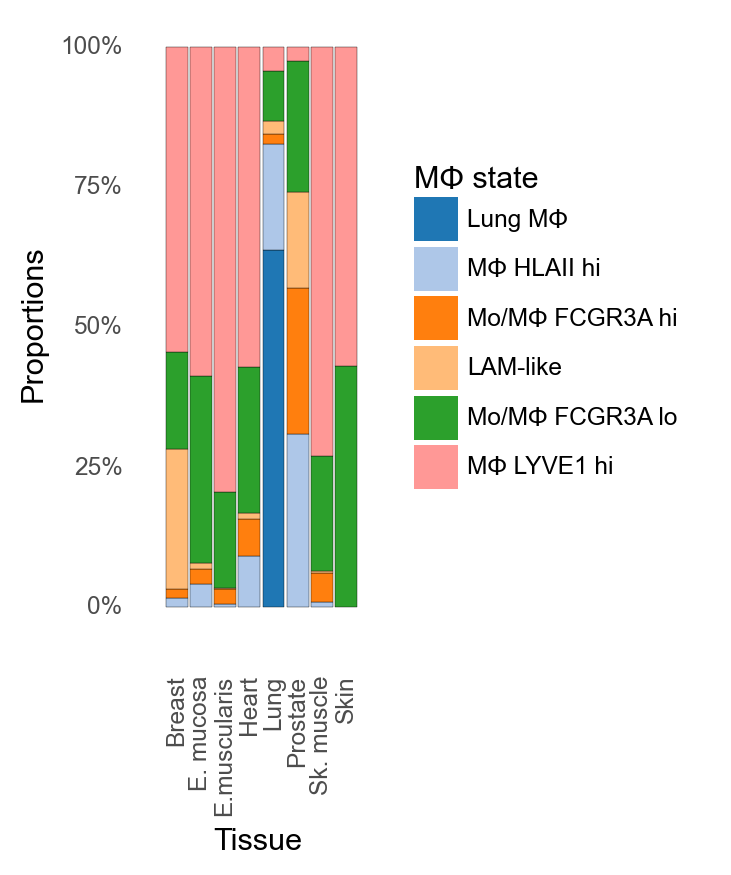

<ggplot: (8793432328620)>

In [42]:
mac_states = ['Lung MΦ', 'MΦ HLAII hi', 'Mo/MΦ FCGR3A hi', 'LAM-like', 'Mo/MΦ FCGR3A lo', 'MΦ LYVE1 hi']

g = plot_proportion_barplot(
    ad[ad.obs.annotation.isin(mac_states) & (ad.obs.sample_tissue.isin(st))], 
    'Tissue', 
    fill='annotation', 
    fill_breakdown='Tissue',
    #legend_position=(1.1,0.5), 
    legend_position=None,     
    percent_limit=5,
    width_scale=0.5, 
    height_scale=0.4, 
    show_percent=False,
    swap_axes=True,
    fill_label='MΦ state')

ggsave(g, 'figure/Figure-S11-F.pdf')

g

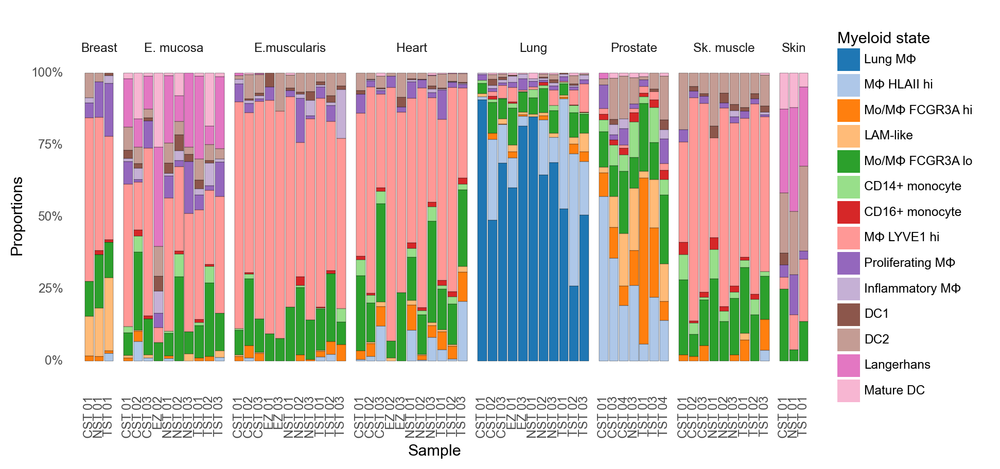

<ggplot: (8793432385796)>

In [43]:
props = ad[ad.obs.sample_tissue.isin(st)].obs[['Tissue', 'sample_tissue']].drop_duplicates().groupby(['Tissue']).size().values

g = plot_proportion_barplot(
    ad[ad.obs.sample_tissue.isin(st)],
    'sample_tissue',
    fill='annotation', fill_breakdown='Tissue',
    y_label_func=lambda f: [' '.join(x.split('-')[1:]) for x in f.keys()],
    fill_label='Myeloid state',
    percent_limit=5,
    width_scale=0.5,
    height_scale=.35, 
    show_percent=False, 
    yaxis_label='Sample',
    swap_axes=True,
) + facet_grid('~Tissue', scales='free_x', space={'x': props})
ggsave(g, 'figure/Figure-S11-G.pdf')
g

In [44]:
ad.obs.annotation.cat.categories

Index(['Lung MΦ', 'MΦ HLAII hi', 'Mo/MΦ FCGR3A hi', 'LAM-like',
       'Mo/MΦ FCGR3A lo', 'CD14+ monocyte', 'CD16+ monocyte', 'MΦ LYVE1 hi',
       'Proliferating MΦ', 'Inflammatory MΦ', 'DC1', 'DC2', 'Langerhans',
       'Mature DC'],
      dtype='object')

In [48]:
ad.uns_keys()

['Sex_colors',
 'Tissue_colors',
 'annotation_colors',
 'annotation_sizes',
 'broad_colors',
 'dendrogram_annotation',
 'dendrogram_leiden',
 'granular_colors',
 'hvg',
 'lam_02_colors',
 'leiden',
 'leiden_DE',
 'neighbors',
 'paga',
 'participant_id_colors',
 'pca',
 'prediction_colors',
 'prep_colors',
 'rank_genes_groups',
 'tissue_colors',
 'umap']

In [49]:
ad.uns['LAM_prediction_colors'] = ad.uns['lam_02_colors']

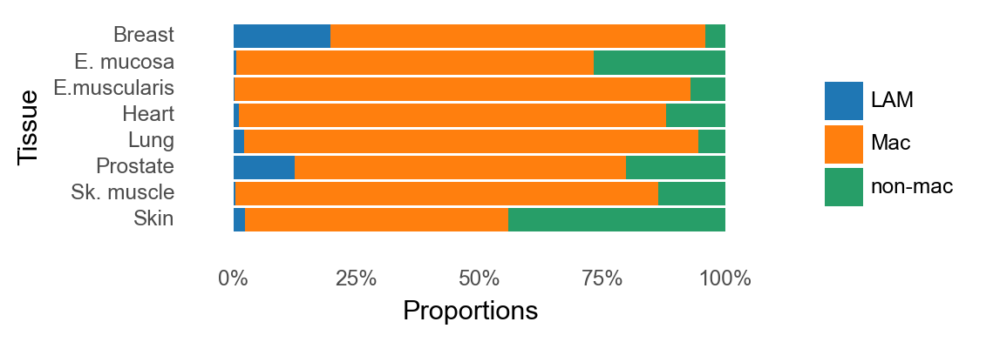

<ggplot: (8793411525476)>

In [50]:
plot_proportion_barplot(ad, 'Tissue', fill='LAM_prediction', legend_position=(1.1,0.5), fill_label='', percent_limit=5, width_scale=0.5, height_scale=0.5, show_percent=False)

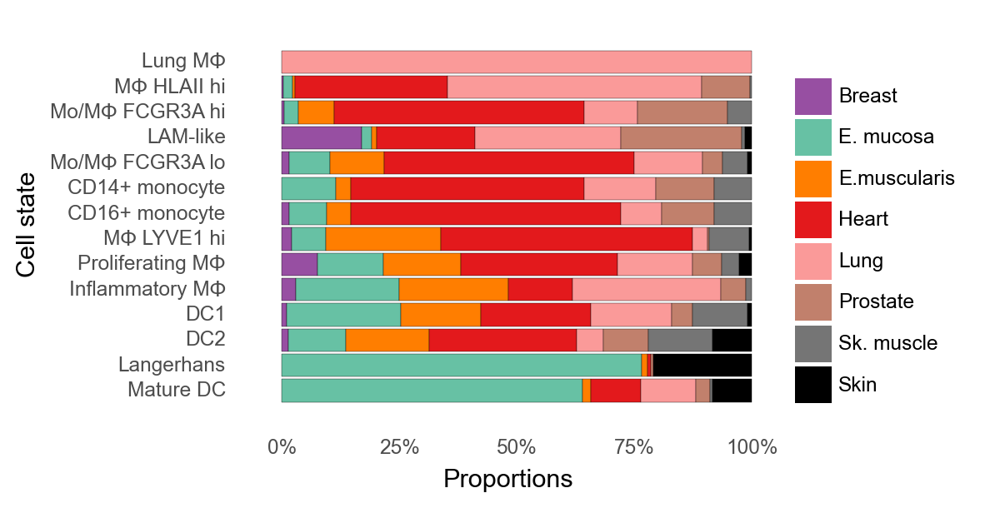

<ggplot: (8793432226823)>

In [51]:
g = plot_proportion_barplot(ad, 'annotation', fill='Tissue', fill_breakdown='annotation', yaxis_label='Cell state', legend_position=(1.05,0.5), fill_label='', percent_limit=5, width_scale=0.5, height_scale=0.5, show_percent=False)
ggsave(g, 'figure/Figure3C-lower.pdf')
g

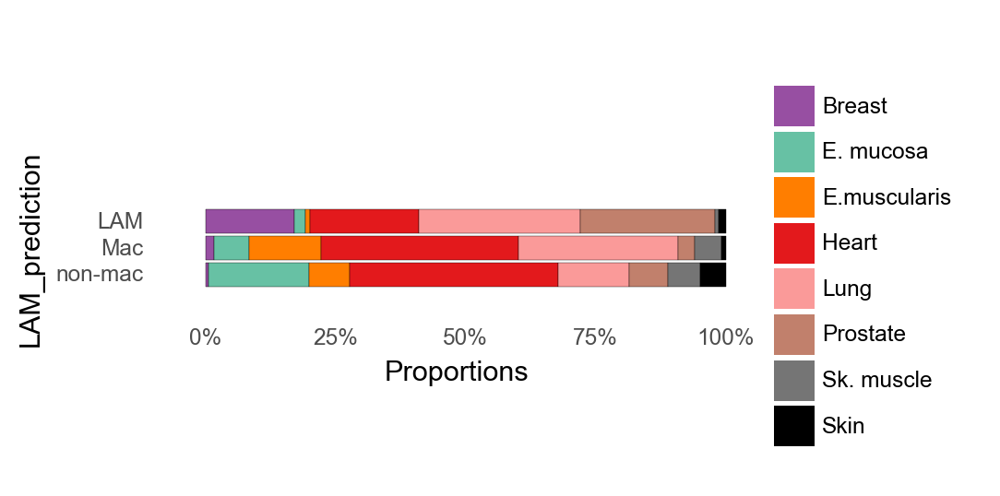

<ggplot: (8793410971920)>

In [53]:
plot_proportion_barplot(ad, 'LAM_prediction', fill='Tissue', fill_breakdown='LAM_prediction', legend_position=(1.05,0.5), fill_label='', percent_limit=5, width_scale=0.5, height_scale=0.5, show_percent=False)

## Compare between- and within-tissue correlations

In [58]:
prop_df = get_proportions_per_channel(ad[ad.obs.sample_tissue.isin(st)], 'sample_tissue', 'annotation', covariates=['Tissue'])
prop_df = pd.concat([prop_df[0], prop_df[1]], axis=1).reset_index().set_index('Tissue').rename(columns={'sample_tissue': 'Sample'})

In [111]:
prop_df

,Sample,Lung MΦ,MΦ 2,Mo/MΦ2,LAM-like,Mo/MΦ1,CD14+ monocyte,CD16+ monocyte,MΦ 1,Proliferating MΦ,Inflammatory MΦ,DC1,DC2,Langerhans,Mature DC
Tissue,,,,,,,,,,,,,,,
Breast,Breast-CST-01,0.0,0.000000,0.017241,0.137931,0.120690,0.000000,0.000000,0.568966,0.051724,0.017241,0.000000,0.086207,0.000000,0.000000
Breast,Breast-NST-01,0.0,0.000000,0.015385,0.169231,0.184615,0.000000,0.015385,0.461538,0.123077,0.000000,0.000000,0.030769,0.000000,0.000000
Breast,Breast-TST-01,0.0,0.026316,0.008772,0.254386,0.122807,0.000000,0.008772,0.359649,0.184211,0.026316,0.008772,0.000000,0.000000,0.000000
E. mucosa,E. mucosa-CST-01,0.0,0.000000,0.009901,0.009901,0.079208,0.019802,0.000000,0.495050,0.079208,0.009901,0.029703,0.079208,0.168317,0.019802
E. mucosa,E. mucosa-CST-02,0.0,0.067278,0.036697,0.003058,0.272171,0.055046,0.021407,0.165138,0.009174,0.039755,0.015291,0.058104,0.097859,0.159021
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Sk. muscle,Sk. muscle-TST-02,0.0,0.000000,0.000000,0.000000,0.160714,0.053571,0.017857,0.660714,0.017857,0.000000,0.017857,0.071429,0.000000,0.000000
Sk. muscle,Sk. muscle-TST-03,0.0,0.037879,0.106061,0.000000,0.151515,0.015152,0.000000,0.537879,0.007576,0.007576,0.022727,0.106061,0.000000,0.007576
Skin,Skin-CST-01,0.0,0.000000,0.000000,0.000000,0.250000,0.000000,0.000000,0.041667,0.041667,0.000000,0.041667,0.208333,0.291667,0.125000


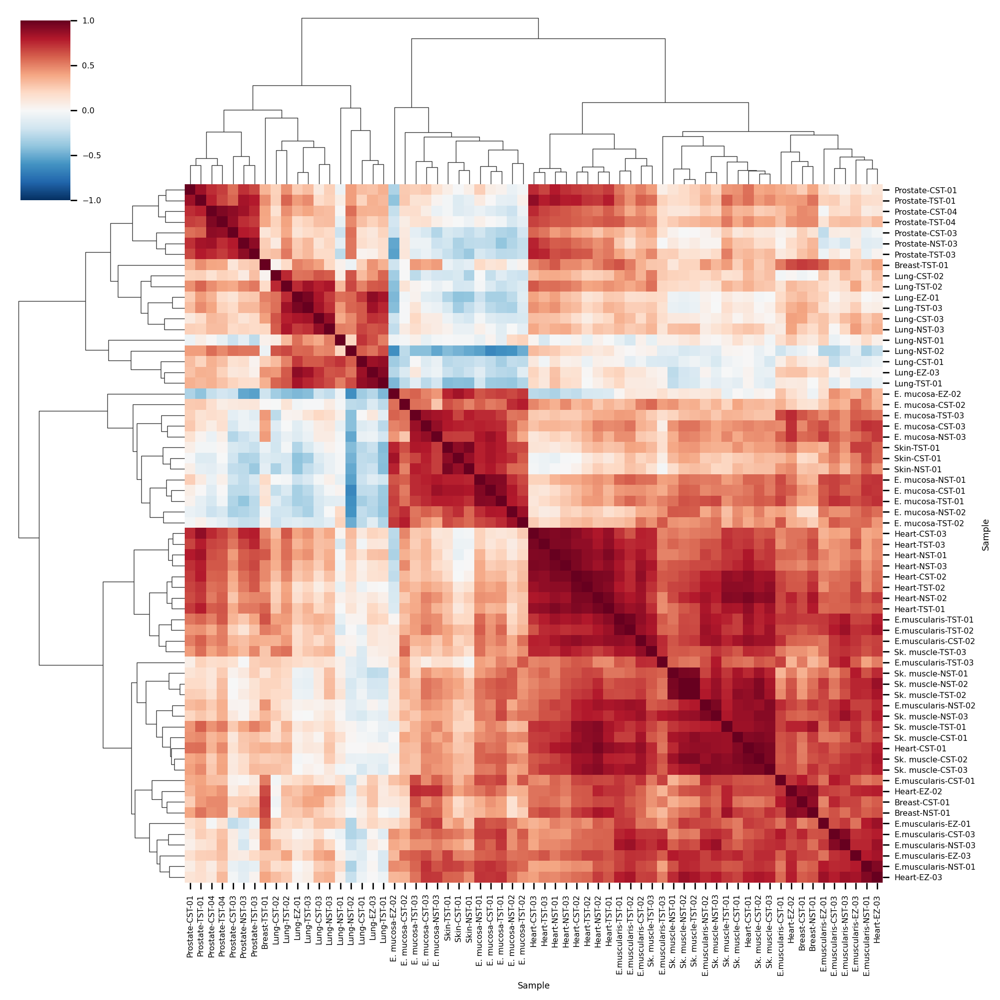

In [112]:
with sns.plotting_context("paper", font_scale=0.65):
    f = sns.clustermap(prop_df.set_index('Sample').T.corr('spearman'), cmap='RdBu_r', vmin=-1, vmax=1, method='complete', figsize=(10,10))
    
f.savefig('figure/SFigure3-1I.pdf')

In [114]:
corrs = {}

for t in ad.obs.Tissue.cat.categories:
    cormat = prop_df.loc[t].set_index(['Sample']).T.corr('spearman').values
    corrs[t] = cormat[np.triu_indices_from(cormat, k=1)]

In [115]:
prop_df_inter = get_proportions_per_channel(ad[ad.obs.sample_tissue.isin(st)], 'Tissue', 'annotation')
cormat_inter = prop_df_inter.T.corr('spearman').values
corrs['Inter-tissue'] = cormat_inter[np.triu_indices_from(cormat_inter, k=1)]

In [116]:
cor_df = pd.DataFrame(dict(cor=corrs)).explode('cor').reset_index().rename(columns={'index': 'tissue'})
cor_df['cor'] = cor_df.cor.astype(float)
cor_df['tissue'] = pd.Categorical(cor_df['tissue'], categories=ad.obs.Tissue.cat.categories.tolist() + ['Inter-tissue'])
cor_df

,tissue,cor
0,Breast,0.888191
1,Breast,0.699798
2,Breast,0.679251
3,E. mucosa,0.519564
4,E. mucosa,0.764853
...,...,...
296,Sk. muscle,0.672458
297,Sk. muscle,0.599674
298,Skin,0.868438
299,Skin,0.893389


<ggplot: (8730397881528)>

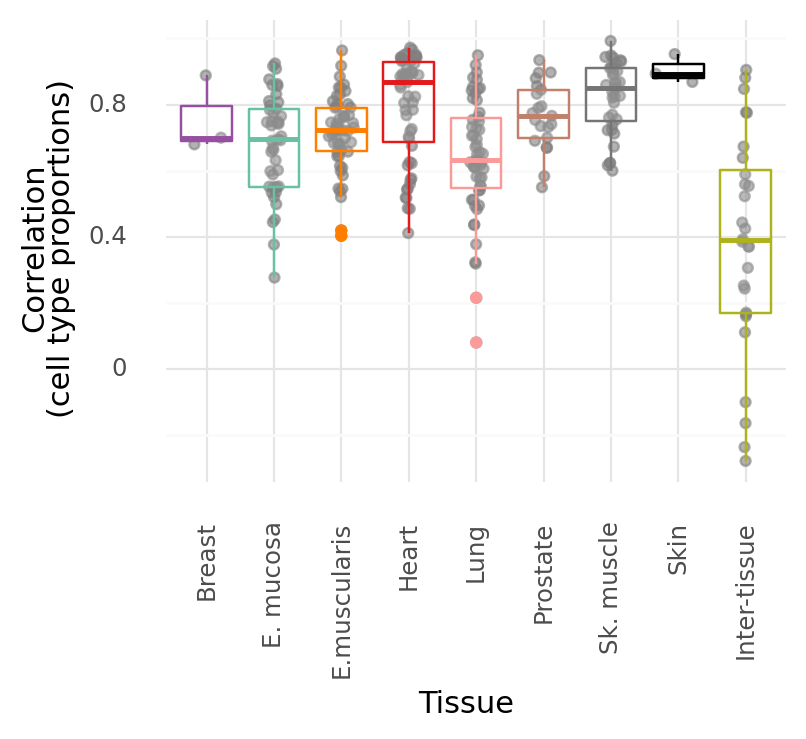

In [120]:
g = (
    ggplot(aes(x='tissue', y='cor'), data=cor_df) + 
    geom_sina(alpha=0.6, color='grey') + 
    geom_boxplot(aes(color='tissue'), alpha=0.1, show_legend=False) + 
    labs(x='Tissue', y='Correlation\n(cell type proportions)', color='Tissue') + 
    theme_minimal() + 
    scale_color_manual(values=ad.uns['Tissue_colors'].tolist() + ['#AEB21B']) +
    theme(axis_text_x=element_text(angle=90), figure_size=(4,3))
)

ggsave(g, 'figure/SFigure3-1H.pdf')
g

## Mo/MΦ diffusion map

In [14]:
ad.obs.annotation.cat.categories

Index(['Lung MΦ', 'MΦ HLAII hi', 'Mo/MΦ FCGR3A hi', 'LAM-like',
       'Mo/MΦ FCGR3A lo', 'CD14+ monocyte', 'CD16+ monocyte', 'MΦ LYVE1 hi',
       'Proliferating MΦ', 'Inflammatory MΦ', 'DC1', 'DC2', 'Langerhans',
       'Mature DC'],
      dtype='object')

In [85]:
ad_momac = ad[ad.obs.annotation.isin([x for x in mac_states if x != 'Lung MΦ'] + ['CD14+ monocyte', 'CD16+ monocyte'])].copy()
ad_momac

AnnData object with n_obs × n_vars = 10057 × 16150
    obs: 'n_genes', 'fpr', 'tissue', 'prep', 'individual', 'nGenes', 'nUMIs', 'PercentMito', 'PercentRibo', 'Age_bin', 'Sex', 'Sample ID', 'participant_id', 'Container', 'Sample ID short', 'RIN score from PAXgene tissue Aliquot', 'RIN score from Frozen tissue Aliquot', 'Age', 'BMI', 'race_ethnicity', 'Autolysis Score', 'Sample Ischemic Time (mins)', 'Tissue Site Detail', 'scrublet', 'scrublet_score', 'barcode', 'batch', 'prediction', 'annotation', 'broad', 'granular', 'leiden', 'annotation_backup', 'leiden_sub', 'Tissue', 'lam_02', 'Alv. MΦ score', 'LAM score', 'ind_tissue', 'sample_tissue', 'prep_ind', 'annotation_tissue', 'channel'
    var: 'gene_ids', 'Chromosome', 'gene_name', 'gene_biotype', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Sex_colors', 'Tissue_colors', 'annotation_colors', 'annotation_sizes', 'broad_colors', 'dendrogram_annotation', 'dendrogram_leiden', 'granular_co

In [86]:
from harmony import harmonize

ad_momac.X = ad_momac.layers['counts'].copy()
sc.pp.normalize_total(ad_momac, target_sum=10000)
sc.pp.log1p(ad_momac)
sc.pp.highly_variable_genes(ad_momac, n_top_genes=2000)
#sc.pp.scale(ad_momac, max_value=10)
sc.pp.pca(ad_momac)
ad_momac.obsm['X_harmony'] = harmonize(ad_momac.obsm['X_pca'], ad_momac.obs, ['prep', 'participant_id'])
sc.pp.neighbors(ad_momac, use_rep='X_harmony', n_neighbors=8)
sc.tl.umap(ad_momac)
sc.tl.diffmap(ad_momac)
sc.tl.leiden(ad_momac, resolution=1.5)

	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
	Completed 6 / 10 iteration(s).
	Completed 7 / 10 iteration(s).
	Completed 8 / 10 iteration(s).
	Completed 9 / 10 iteration(s).
	Completed 10 / 10 iteration(s).


In [87]:
del ad_momac.uns['annotation_colors']

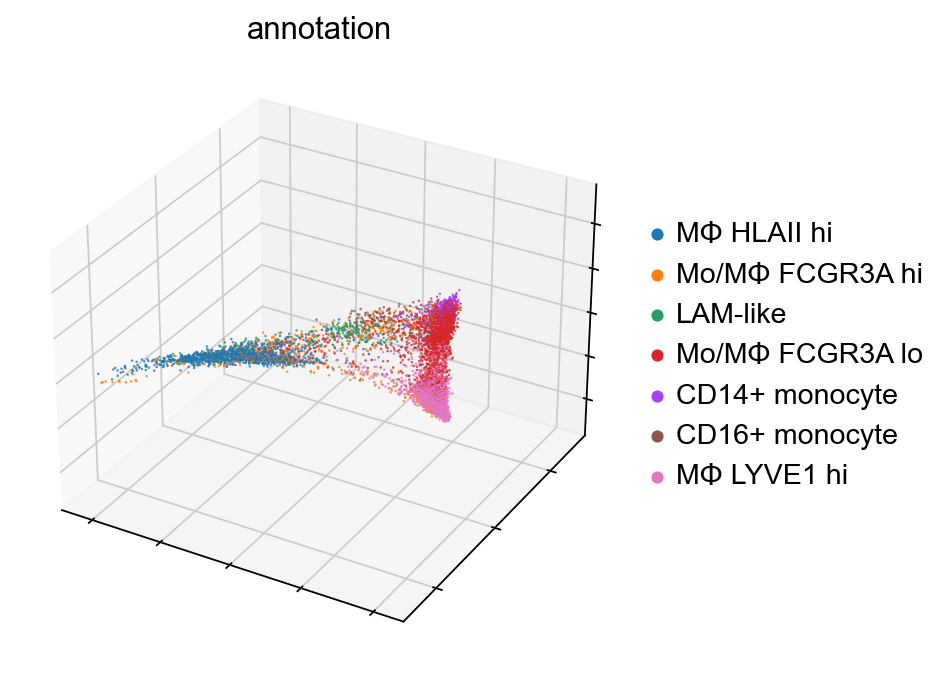

In [88]:
scv.pl.diffmap(ad_momac, color='annotation', projection='3d', legend_loc='right margin', figsize=(5,5), size=5, alpha=0.8)

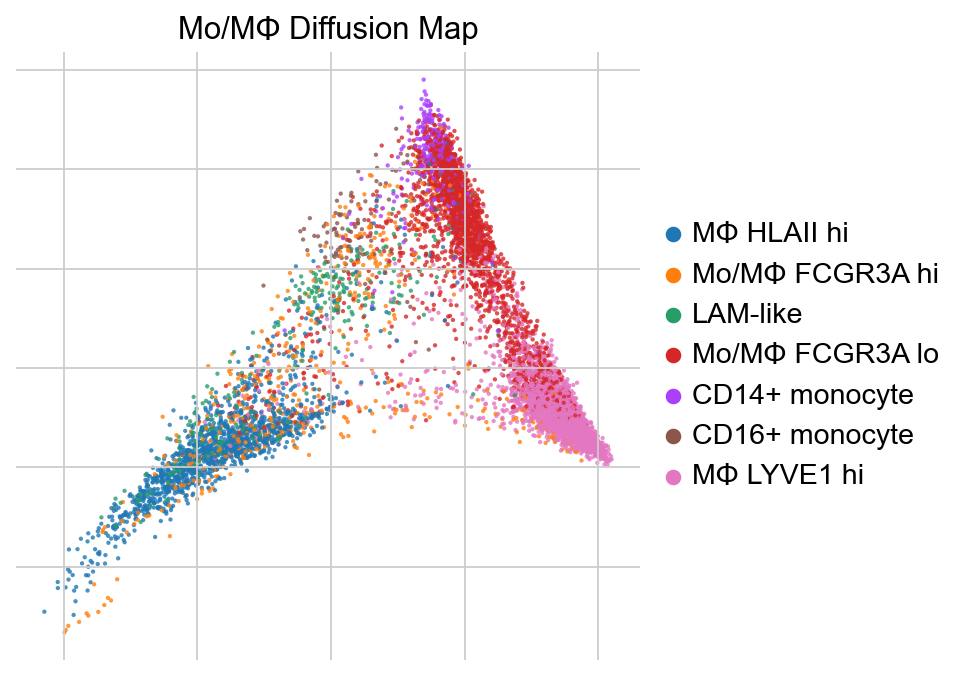

In [89]:
scv.pl.diffmap(ad_momac, color='annotation', legend_loc='right margin', figsize=(5,5), size=15, alpha=0.8, title='Mo/MΦ Diffusion Map') #, save=)

## Mac residency markers

In [72]:
newnames

{'MΦ 1': 'MΦ LYVE1 hi',
 'MΦ 2': 'MΦ HLAII hi',
 'Mo/MΦ2': 'Mo/MΦ FCGR3A hi',
 'Mo/MΦ1': 'Mo/MΦ FCGR3A lo'}

In [73]:
mac_cats = [
    'MΦ LYVE1 hi',
    'MΦ HLAII hi', 
]

In [74]:
ad.obs.annotation.value_counts()

MΦ LYVE1 hi         5068
Lung MΦ             2426
Mo/MΦ FCGR3A lo     2338
MΦ HLAII hi         1339
Mo/MΦ FCGR3A hi      579
DC2                  552
Proliferating MΦ     421
CD14+ monocyte       314
LAM-like             283
Langerhans           252
Mature DC            169
Inflammatory MΦ      168
CD16+ monocyte       136
DC1                  111
Name: annotation, dtype: int64

In [75]:
pd.crosstab(ad.obs.annotation, ad.obs.Tissue)

Tissue,Breast,E. mucosa,E.muscularis,Heart,Lung,Prostate,Sk. muscle,Skin
annotation,,,,,,,,
Lung MΦ,0,0,0,0,2426,0,0,0
MΦ HLAII hi,4,25,8,435,724,138,5,0
Mo/MΦ FCGR3A hi,3,17,44,308,66,111,30,0
LAM-like,48,6,3,59,88,73,2,4
Mo/MΦ FCGR3A lo,34,206,270,1241,340,102,123,22
CD14+ monocyte,0,36,10,156,48,39,25,0
CD16+ monocyte,2,11,7,78,12,15,11,0
MΦ LYVE1 hi,108,362,1243,2716,165,12,432,30
Proliferating MΦ,32,59,69,141,67,26,16,11


In [76]:
ad.obs['annotation_tissue'] = ad.obs.annotation.astype(str) + '_' + ad.obs.Tissue.astype(str)

In [77]:
valid_at = ad.obs.annotation_tissue.value_counts()>=15
valid_at = valid_at[valid_at].index

In [ ]:
ad_sub = ad[ad.obs.annotation.isin(mac_cats) & (ad.obs.annotation_tissue.isin(valid_at))].copy()
ad_sub._sanitize()

In [ ]:
ad_sub._inplace_subset_var(~(ad_sub.var_names.str.startswith('RPL') | ad_sub.var_names.str.startswith('RPS')))

In [80]:
ad_sub.obs['annotation_tissue'].cat.reorder_categories([
    'MΦ LYVE1 hi_E.muscularis',
    'MΦ LYVE1 hi_Heart',    
    'MΦ LYVE1 hi_Sk. muscle',     
    'MΦ LYVE1 hi_E. mucosa', 
    'MΦ LYVE1 hi_Breast',
    'MΦ LYVE1 hi_Lung',     
    'MΦ LYVE1 hi_Skin',
    'MΦ HLAII hi_E. mucosa',
    'MΦ HLAII hi_Lung',    
    'MΦ HLAII hi_Heart',
    'MΦ HLAII hi_Prostate'
], inplace=True)

In [81]:
markers = {
    'Common\nMΦ LYVE1 hi markers': ['F13A1','MRC1','SEPP1','LYVE1'],
    'Tissue-specific\nMΦ LYVE1 hi markers': ['PTPRG', 'HDAC9', 'WWP1', 'CSGALNACT1', 'RASSF4', 'MARCO','CD209', 'CLEC7A', 'IL1R2'],
    'Common\nMΦ HLAII hi markers': ['CD68','HLA-A','PSAP','HLA-DRA'],
    'Tissue-specific\nMΦ HLAII hi markers': ['MMP14','NKG7','LY6E','APOO', 'CD9', 'CD36','FCN1','IL18R1'],
}

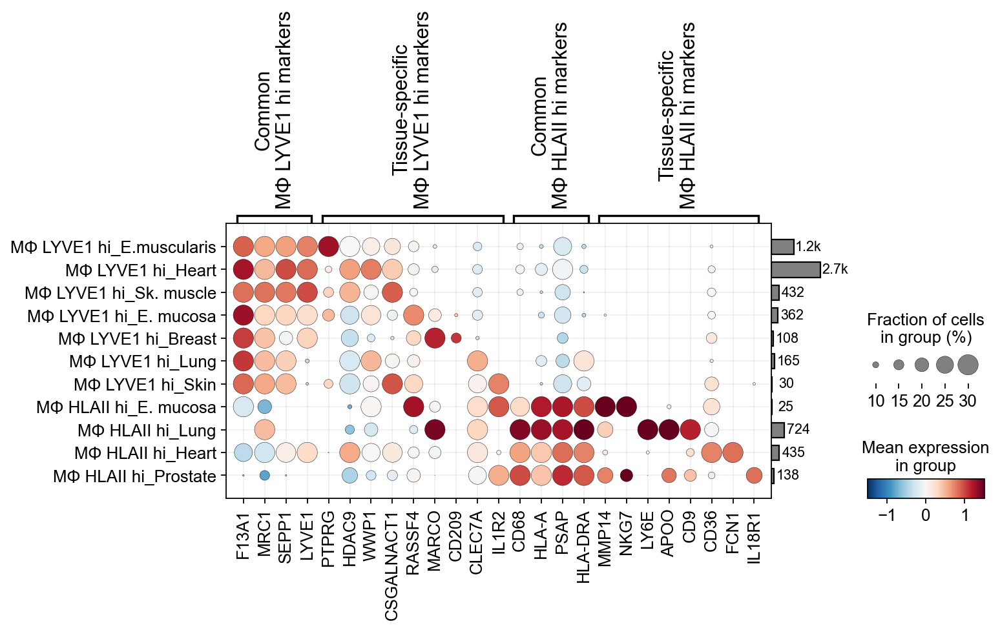

In [75]:
f = sc.pl.dotplot(ad_sub, 
              #[y for x in markers.values() for y in x],
              markers,
              groupby='annotation_tissue', mean_only_expressed=False, use_raw=False, return_fig=True, layer='scaled',
              cmap='RdBu_r', vmax=1.5, vmin=-1.5, dendrogram=False, figsize=(9.4,3.5)).add_totals(color='grey').style(grid=True, dot_max=.3, dot_min=.05, cmap='RdBu_r')
f.savefig('figure/Figure3D.pdf')

In [83]:
sc.tl.rank_genes_groups(ad_sub, 'annotation_tissue')

In [95]:
sc.get.rank_genes_groups_df(ad_sub, 'MΦ HLAII hi_Prostate').query("names=='NKG7'")

,names,scores,logfoldchanges,pvals,pvals_adj
156,NKG7,4.618319,6.38812,0.000009,0.000113


In [96]:
sc.get.rank_genes_groups_df(ad_sub, 'MΦ HLAII hi_E. mucosa').query("names=='NKG7'")

,names,scores,logfoldchanges,pvals,pvals_adj
85,NKG7,2.808665,6.016786,0.00973,0.029485


In [76]:
ad_sub.write('immune-atlas-annotated-mac1-mac2.h5ad')

# Muscle markers

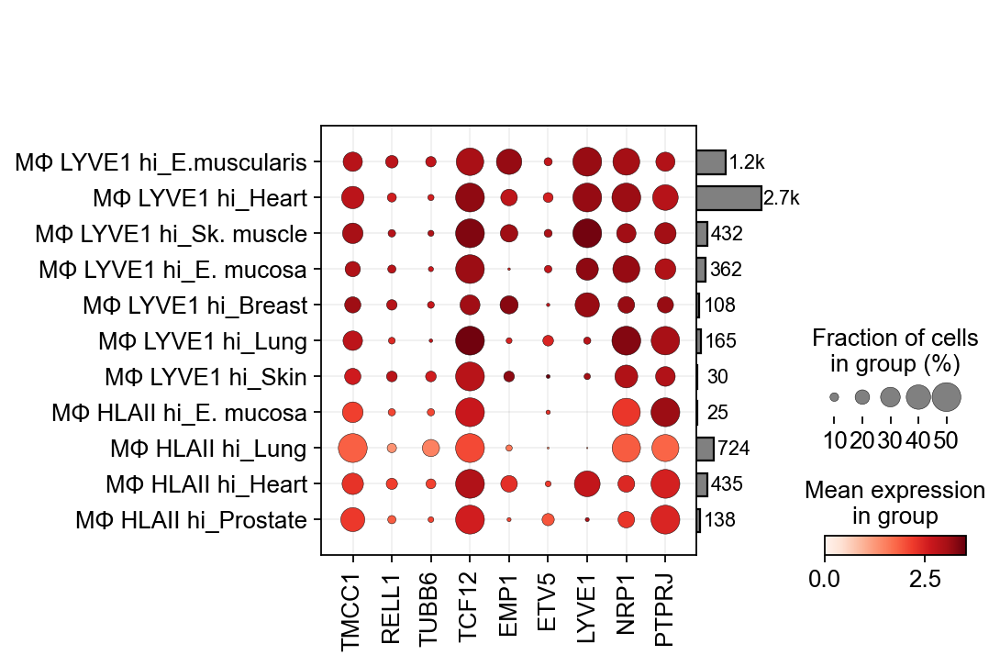

In [77]:
f = sc.pl.dotplot(ad_sub, ['TMCC1', 'RELL1', 'TUBB6', 'TCF12', 'EMP1', 'ETV5', 'LYVE1', 'NRP1', 'PTPRJ'],
              groupby='annotation_tissue', mean_only_expressed=True, use_raw=False, return_fig=True,
              cmap='Reds', dendrogram=False).add_totals(color='grey').style(grid=True, dot_max=.5, cmap='Reds')

#f.savefig('figure/SFigure3-1I.pdf')
f.show()

## LAM classification

In [84]:
#ad.uns['lam_02_colors'] = ['#ff9896', '#ffbb78', '#8c564b'] #['#d62728', '#ffbb78',  '#8c564b',]

ad.obs.lam_02.cat.rename_categories(['LAM', 'MΦ', 'non-MΦ'], inplace=True)

In [85]:
del ad.uns['lam_02_colors']

In [88]:
ad.obs.lam_02.value_counts()

MΦ        12261
non-MΦ     1612
LAM         283
Name: lam_02, dtype: int64

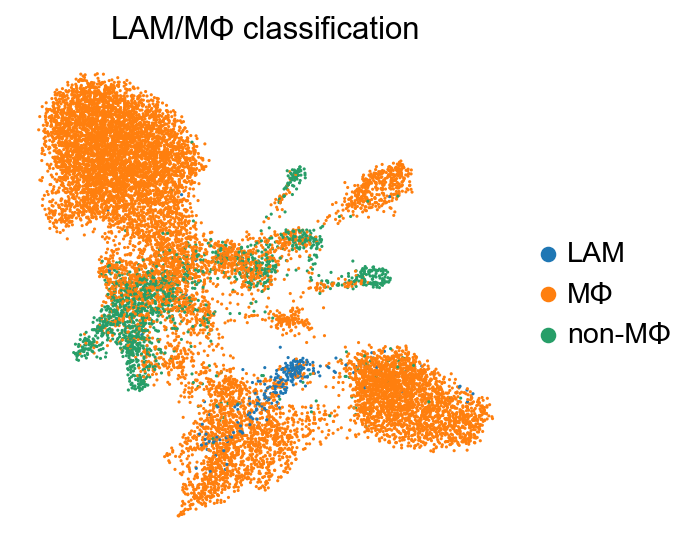

In [91]:
sc.pl.umap(ad, color='lam_02', size=8, title='LAM/MΦ classification', frameon=False) #, figsize=(4,4) #, save='Figure3E.pdf')

In [92]:
ad.uns['lam_02_colors']

['#1f77b4', '#ff7f0e', '#279e68']

## LAM scoring

In [211]:
model = joblib.load('../lam-model.joblib')
model

LogisticRegressionCV(class_weight='balanced', n_jobs=-1, scoring='f1_weighted')

In [212]:
import pandas as pd
import anndata
import numpy as np

def poor_mans_buggy_reindex(labels, adata, axis=1, fill_value=None):
    if axis == 1:
        ph = anndata.AnnData(np.ones([0, len(labels)]), var=pd.DataFrame(index=labels))
        ret = anndata.concat([adata, ph], join='outer', axis=0, fill_value=fill_value)
        return ret[:, labels].copy()
    else:
        ph = anndata.AnnData(np.ones([len(labels), 0]), obs=pd.DataFrame(index=labels))   
        ret = anndata.concat([adata, ph], join='outer', axis=1, fill_value=fill_value)
        return ret[labels].copy()    

In [ ]:
ad_sub = poor_mans_buggy_reindex(model.genes, ad)

In [214]:
coef_df = pd.DataFrame(model.coef_, index=model.classes_, columns=model.genes).T

In [215]:
lam_coefs = coef_df['MΦ TREM2 hi'].values
lam_coefs

array([-0.01287171,  0.04971643, -0.00072097, ...,  0.02645742,
       -0.0025636 ,  0.00118307])

In [216]:
ad.obs['logistic_lam_score'] = pd.DataFrame(ad_sub.X.A * lam_coefs, index=ad.obs.index, columns=model.genes).sum(1) #.groupby(final_lam.obs.tissue)

In [217]:
ad.obs['tissue_lam'] = ad.obs.Tissue.astype(str) + ' (' + ad.obs.lam_02.astype(str) + ')'

In [219]:
ad._sanitize()

... storing 'tissue_lam' as categorical


In [220]:
ad_sub = ad[(ad.obs.lam_02!='non-MΦ') & (~(ad.obs.tissue.isin(['skin', 'skeletalmuscle', 'esophagusmucosa', 'esophagusmuscularis']) & (ad.obs.lam_02 == 'LAM')))].copy()
#del ad_sub.uns['tissue_lam_colors']

In [221]:
ad_sub.obs.tissue_lam

CST01_CCTCTGAGTCACCTAA-breast    Breast (LAM)
CST01_GGTGCGTCATGCATGT-breast    Breast (LAM)
CST01_CCAATCCAGGGCTCTC-breast     Breast (MΦ)
CST01_GATCAGTCAGTCACTA-breast     Breast (MΦ)
CST01_CGTTGGGGTGCTAGCC-breast     Breast (MΦ)
                                     ...     
TST01_ATGTGTGCACGGTGTC-skin         Skin (MΦ)
TST01_TCTGGAACATCGATGT-skin         Skin (MΦ)
TST01_TTCTCCTAGAGTACCG-skin         Skin (MΦ)
TST01_GTCACAACACAACGCC-skin         Skin (MΦ)
CST03_CAGCTGGTCAAACAAG-skin         Skin (MΦ)
Name: tissue_lam, Length: 12529, dtype: category
Categories (12, object): ['Breast (LAM)', 'Breast (MΦ)', 'E. mucosa (MΦ)', 'E.muscularis (MΦ)', ..., 'Prostate (LAM)', 'Prostate (MΦ)', 'Sk. muscle (MΦ)', 'Skin (MΦ)']

In [222]:
ad_sub.obs.tissue_lam.cat.reorder_categories([
    'Prostate (LAM)',     
    'Heart (LAM)',     
    'Lung (LAM)',     
    'Breast (LAM)', 

    'Prostate (MΦ)',     
    'Lung (MΦ)',
    'Breast (MΦ)',    
    'Heart (MΦ)',         

    'E.muscularis (MΦ)',        
    'E. mucosa (MΦ)', 
    'Sk. muscle (MΦ)', 
    'Skin (MΦ)',
], inplace=True)

In [223]:
ad_sub.obs.tissue.cat.categories

Index(['breast', 'esophagusmucosa', 'esophagusmuscularis', 'heart', 'lung',
       'prostate', 'skeletalmuscle', 'skin'],
      dtype='object')

In [224]:
ad_sub.uns['tissue_colors']

array(['#974fa2', '#67c1a4', '#ff7e00', '#e3191c', '#fa9a99', '#c1806c',
       '#757575', '#000000'], dtype=object)

In [225]:
ad_sub.uns['tissue_lam_colors'] = [
     '#c1806c', '#e3191c', '#fa9a99','#974fa2', 
     '#c1806c', '#fa9a99','#974fa2', '#e3191c', 
     '#ff7e00', '#67c1a4', '#757575', '#000000']

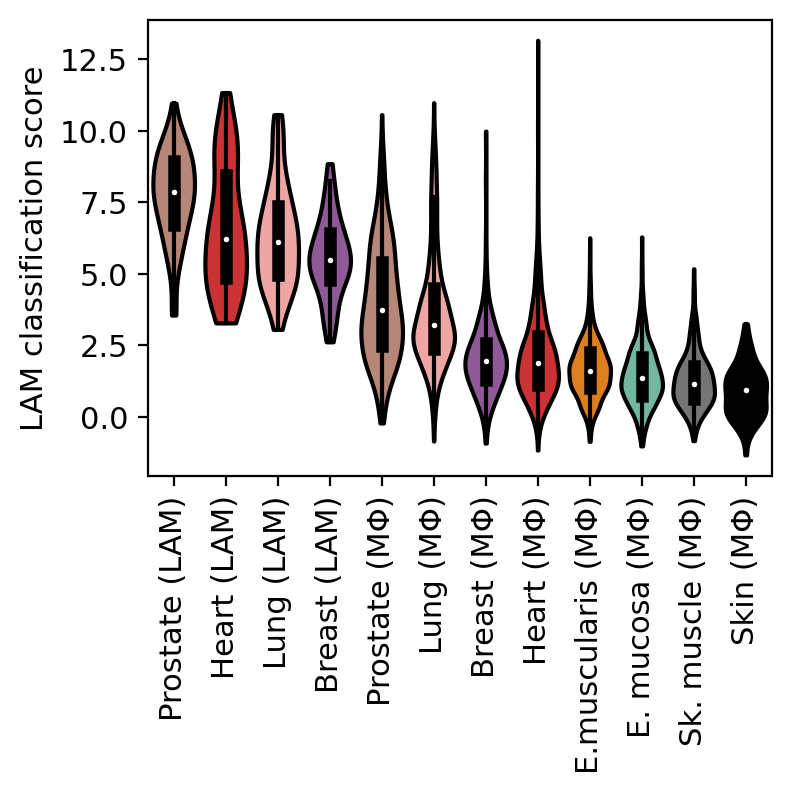

In [232]:
f, ax = plt.subplots(figsize=(4,3))
sc.pl.violin(ad_sub, 'logistic_lam_score', groupby='tissue_lam', rotation=90, ax=ax, stripplot=False, inner='box', show=False)
ax.set_ylabel('LAM classification score')

f.savefig('figure/Figure3F.pdf', bbox_inches='tight')

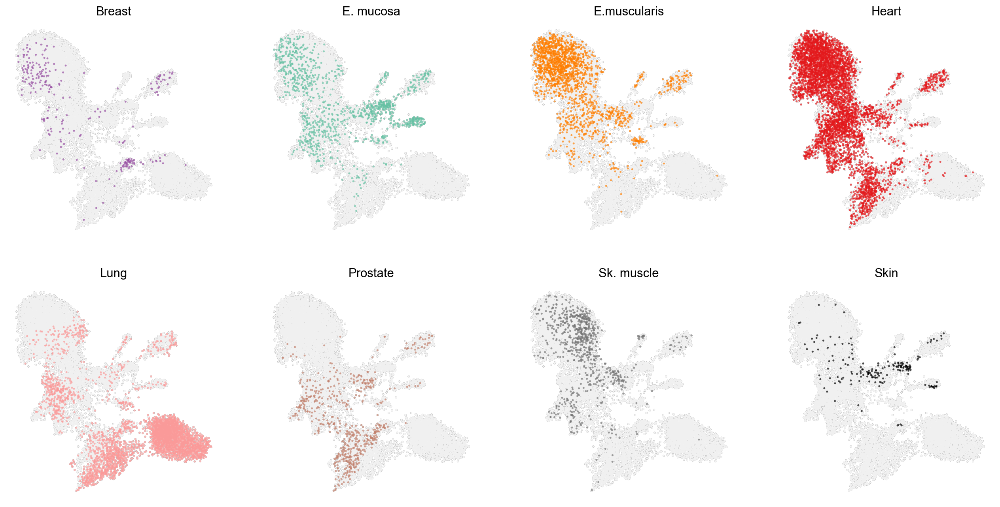

In [93]:
plt.rcParams['figure.figsize'] = (10,10)

f, axs = plt.subplots(2, 4, figsize=(20,10))
axs = axs.flatten()
for t, ax in zip(ad.obs.Tissue.cat.categories, axs):
    sc.pl.umap(ad, color=['Tissue'], ncols=2, wspace=0.5, size=20, groups=t, ax=ax, show=False, title=t, legend_loc='none', na_color='#F0F0F0', add_outline=True, outline_width=(0.01,0.001), frameon=False)

plt.rcParams['figure.figsize'] = (4,4)

f.savefig('figure/Figure-S11-A.pdf', bbox_inches='tight')

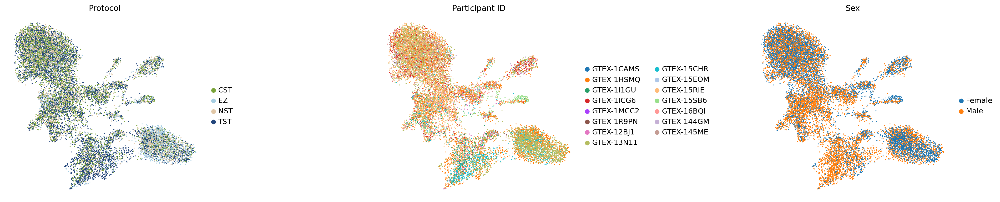

In [12]:
plt.rcParams['figure.figsize'] = (5,5)
sc.pl.umap(ad, color=['prep', 'participant_id', 'Sex'], ncols=3, wspace=0.7, size=10, frameon=False, title=['Protocol', 'Participant ID', 'Sex'], save='SFigure3-1B.pdf')
plt.rcParams['figure.figsize'] = (4,4)

## Some stats

In [48]:
ad._sanitize()

... storing 'annotation_tissue' as categorical


In [50]:
lratio = (pd.DataFrame(ad.obs_vector('LYVE1'), index=ad.obs_names, columns=['LYVE1'])>0).groupby(ad.obs.annotation_tissue).mean()
lratio

,LYVE1
annotation_tissue,
Alveolar MΦ_Lung,0.002473
CD14+ monocyte_E. mucosa,0.027778
CD14+ monocyte_E.muscularis,0.100000
CD14+ monocyte_Heart,0.083333
CD14+ monocyte_Lung,0.000000
...,...
Proliferating MΦ_Heart,0.390071
Proliferating MΦ_Lung,0.000000
Proliferating MΦ_Prostate,0.000000


In [51]:
lratio[lratio.index.isin(['MΦ 1_Heart', 'MΦ 1_Lung', 'MΦ 1_Prostate', 'MΦ 1_Sk. muscle',
       'MΦ 1_Skin',])]*100

,LYVE1
annotation_tissue,
MΦ 1_Heart,61.597938
MΦ 1_Lung,7.878788
MΦ 1_Prostate,25.000000
MΦ 1_Sk. muscle,62.268519
MΦ 1_Skin,6.666667


sc.pl.dotplot(ad_sub, np.array(markers)[idx], groupby=['annotation', 'Tissue'], mean_only_expressed=False, use_raw=False, return_fig=True, layer='scaled', cmap='RdBu_r', vmax=2, vmin=-2, dendrogram=True).add_totals(color='grey').style(grid=True, dot_max=.5, dot_min=.05, cmap='RdBu_r').show()

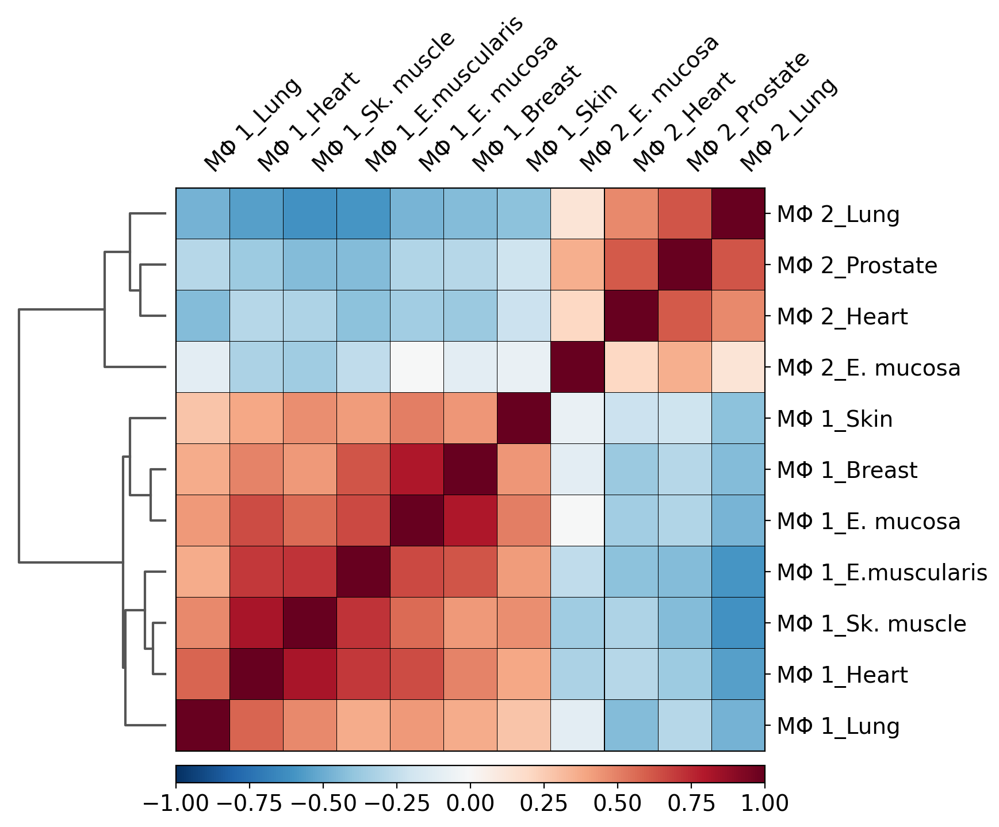

In [53]:
sc.tl.dendrogram(ad_sub, 'annotation_tissue', optimal_ordering=True, use_raw=False)
sc.pl.correlation_matrix(ad_sub, 'annotation_tissue', cmap='RdBu_r')

## Proportions

In [14]:
ad.obs['channel'] = ad.obs.prep.astype(str) + '-' + ad.obs['Sample ID'].astype(str)
ad._sanitize()

... storing 'channel' as categorical


In [37]:
from statsmodels.stats.multitest import multipletests

orig_cats = ad.obs.Tissue.cat.categories

final_res = []
for t in tqdm(ad.obs.Tissue.cat.categories):
    
    ad.obs.Tissue.cat.reorder_categories([t] + [x for x in ad.obs.Tissue.cat.categories if x != t], inplace=True)

    #res = dirichletreg(ad, 'channel', 'annotation', ['Tissue', 'prep'], formula="y ~ Tissue")
    res = [dirichletreg(ad, 'channel', 'annotation', ['Tissue', 'prep'], formula="y ~ Tissue+prep|prep", onevsrest_category=x) for x in tqdm(ad.obs.annotation.cat.categories)]
    res = pd.concat(res, axis=0)
    res = res[res.coef_type == 'mean']
    
    s, p, _, _ = multipletests(res.pval, alpha=0.1, method='fdr_bh')
    res['significant'] = s
    res['pval_adj'] = p
    res['neglog_pval_adj'] = -np.log10(p+1e-200)

    res['variable_tissue'] = [x.split('Tissue')[1] if x.startswith('Tissue') else x for x in res.variable]
    final_res.append(res.assign(reference=t))
    
ad.obs.Tissue.cat.reorder_categories(orig_cats, inplace=True)
res = pd.concat(final_res, axis=0).reset_index(drop=True)

  0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

In [38]:
res.compartment = pd.Categorical(res.compartment, categories=ad.obs.annotation.cat.categories)

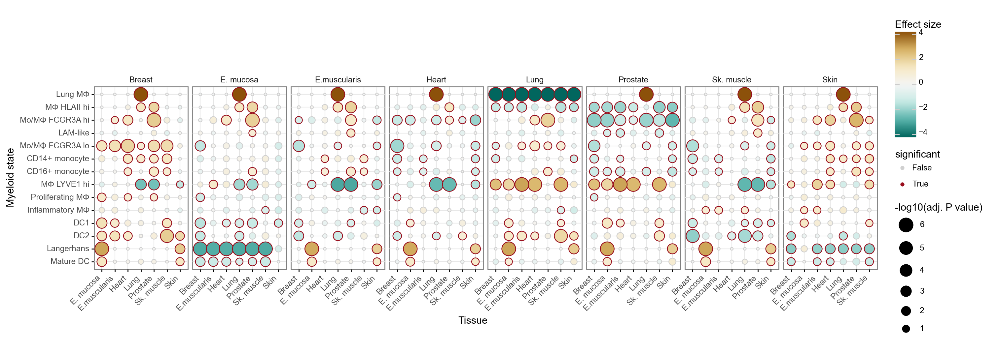

<ggplot: (8744195360750)>

In [98]:
from plotnine import facet_wrap

f = plot_significance_dotplot(
    res[res.variable_tissue.isin(ad.obs.Tissue.cat.categories)], 
    fill_limit=(-4,4), 
    width_scale=1.7, 
    dot_size_limit=8,
    height_scale=0.3,
    size_limit=6, 
    xcol='variable_tissue', 
    xlabel='Tissue',
    ylabel='Myeloid state',
    ycol='compartment',
) + facet_wrap('reference', nrow=1, drop=True, scales='free_x') + theme(strip_background=element_blank())

ggsave(f, 'figure/Figure-S11-E.pdf')
f

In [100]:
res['variable_prep'] = [x.split('prep')[1] if x.startswith('prep') else x for x in res.variable]

In [105]:
res

,coefficient,se,zval,pval,compartment,variable,significance,coef_type,significant,pval_adj,neglog_pval_adj,variable_tissue,reference,variable_prep
0,-4.783673,0.395155,-12.105824,9.837642e-34,Lung MΦ,(Intercept),***,mean,True,2.524995e-32,31.597740,(Intercept),Breast,(Intercept)
1,0.039269,0.425258,0.092343,9.264258e-01,Lung MΦ,TissueE. mucosa,,mean,False,9.935984e-01,0.002789,E. mucosa,Breast,TissueE. mucosa
2,0.023434,0.417291,0.056158,9.552161e-01,Lung MΦ,TissueE.muscularis,,mean,False,9.935984e-01,0.002789,E.muscularis,Breast,TissueE.muscularis
3,0.023434,0.417291,0.056158,9.552161e-01,Lung MΦ,TissueHeart,,mean,False,9.935984e-01,0.002789,Heart,Breast,TissueHeart
4,5.770544,0.375583,15.364246,2.843281e-53,Lung MΦ,TissueLung,***,mean,True,4.378653e-51,50.358660,Lung,Breast,TissueLung
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1227,0.019314,0.454217,0.042521,9.660837e-01,Mature DC,TissueE. mucosa,,mean,False,9.839989e-01,0.007005,E. mucosa,Skin,TissueE. mucosa
1228,-1.321715,0.506920,-2.607345,9.124748e-03,Mature DC,TissueBreast,**,mean,True,2.989811e-02,1.524356,Breast,Skin,TissueBreast
1229,0.052662,0.508945,0.103472,9.175882e-01,Mature DC,prepEZ,,mean,False,9.839989e-01,0.007005,prepEZ,Skin,EZ
1230,-0.257457,0.406629,-0.633149,5.266364e-01,Mature DC,prepNST,,mean,False,7.114212e-01,0.147873,prepNST,Skin,NST


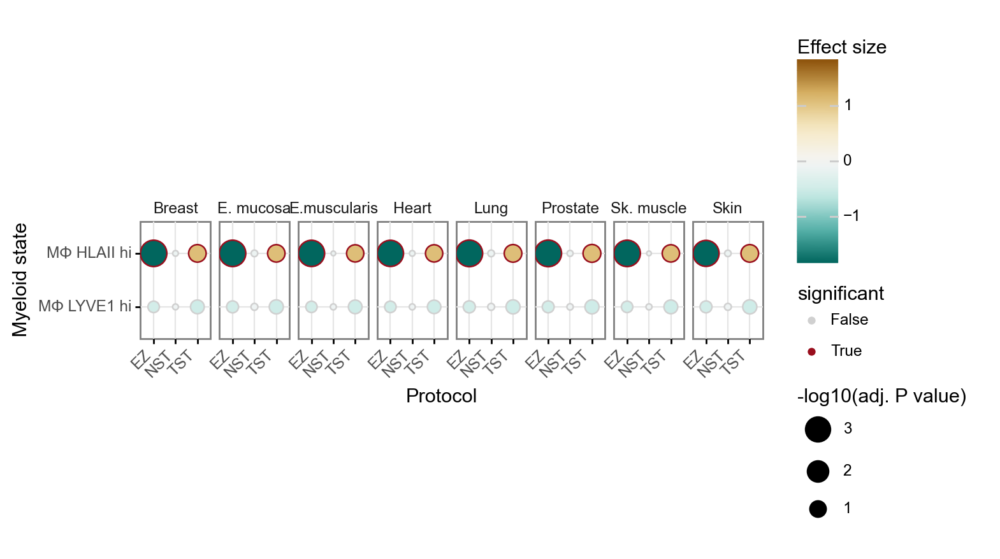

<ggplot: (8744209766470)>

In [119]:
from plotnine import facet_wrap

res_prep = res[res.variable_prep.isin(ad.obs.prep.cat.categories) & (res.compartment.isin(['MΦ HLAII hi', 'MΦ LYVE1 hi']))]
res_prep.compartment.cat.remove_unused_categories(inplace=True)

f = plot_significance_dotplot(
    res_prep, 
    fill_limit=(-4,4), 
    width_scale=0.7, 
    dot_size_limit=8,
    height_scale=0.1,
    size_limit=6, 
    xcol='variable_prep', 
    xlabel='Protocol',
    ylabel='Myeloid state',
    ycol='compartment',
) + facet_wrap('reference', nrow=1, drop=True, scales='free_x') + theme(strip_background=element_blank())

#ggsave(f, 'figure/Figure-S11-E.pdf')
f

In [117]:
res_prep[res_prep.compartment.isin(['MΦ HLAII hi']) & (res_prep.variable_prep == 'EZ')].pval_adj.max()

0.0004138173537421566

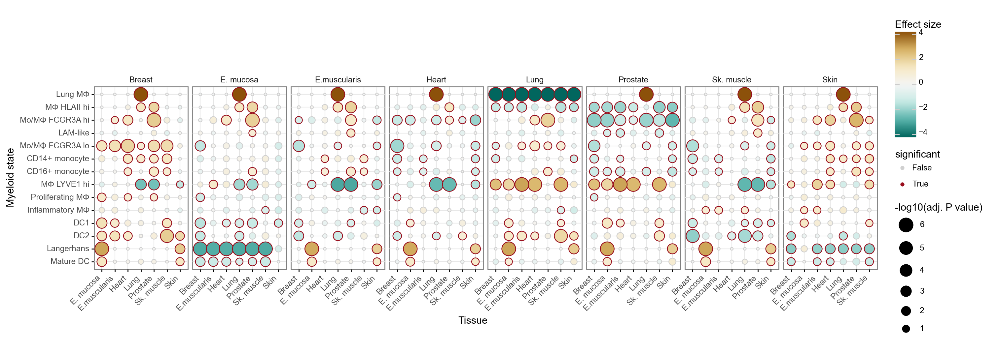

<ggplot: (8744184589584)>

In [39]:
from plotnine import facet_wrap

f = plot_significance_dotplot(
    res[res.variable_tissue.isin(ad.obs.Tissue.cat.categories)], 
    fill_limit=(-4,4), 
    width_scale=1.7, 
    dot_size_limit=8,
    height_scale=0.3,
    size_limit=6, 
    xcol='variable_tissue', 
    xlabel='Tissue',
    ylabel='Myeloid state',
    ycol='compartment',
) + facet_wrap('reference', nrow=1, drop=True, scales='free_x') + theme(strip_background=element_blank())

ggsave(f, 'figure/Figure-S11-E.pdf')
f

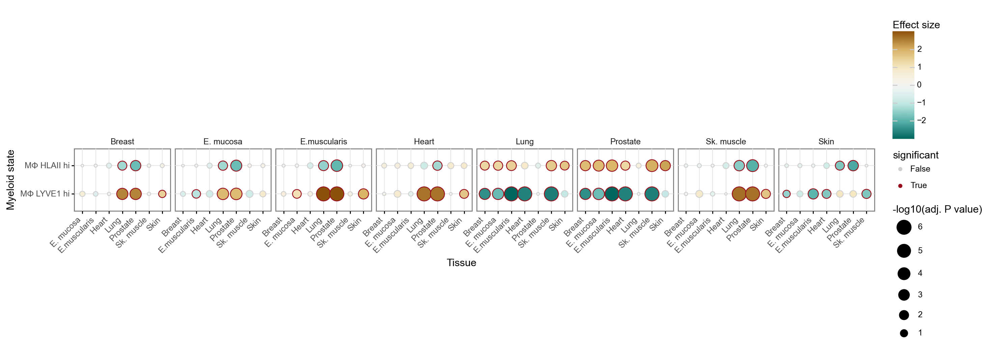

<ggplot: (8744194894574)>

In [70]:
from plotnine import facet_wrap

res_dichotomy = res[res.variable_tissue.isin(ad.obs.Tissue.cat.categories) & (res.compartment.isin(['MΦ HLAII hi', 'MΦ LYVE1 hi']))]
res_dichotomy.compartment.cat.remove_unused_categories(inplace=True)

f = plot_significance_dotplot(
    res_dichotomy, 
    fill_limit=(-4,4), 
    width_scale=1.7, 
    dot_size_limit=8,
    height_scale=0.1,
    size_limit=6, 
    xcol='reference', ## flipped
    xlabel='Tissue',
    ylabel='Myeloid state',
    ycol='compartment',
) + facet_wrap('variable_tissue', nrow=1, drop=True, scales='free_x') + theme(strip_background=element_blank())

f

In [43]:
res.variable.unique()

array(['(Intercept)', 'TissueE. mucosa', 'TissueE.muscularis',
       'TissueHeart', 'TissueLung', 'TissueProstate', 'TissueSk. muscle',
       'TissueSkin', 'prepEZ', 'prepNST', 'prepTST', 'TissueBreast'],
      dtype=object)

In [53]:
res

,coefficient,se,zval,pval,compartment,variable,significance,coef_type,significant,pval_adj,neglog_pval_adj,variable_tissue,reference
0,-4.783673,0.395155,-12.105824,9.837642e-34,Lung MΦ,(Intercept),***,mean,True,2.524995e-32,31.597740,(Intercept),Breast
1,0.039269,0.425258,0.092343,9.264258e-01,Lung MΦ,TissueE. mucosa,,mean,False,9.935984e-01,0.002789,E. mucosa,Breast
2,0.023434,0.417291,0.056158,9.552161e-01,Lung MΦ,TissueE.muscularis,,mean,False,9.935984e-01,0.002789,E.muscularis,Breast
3,0.023434,0.417291,0.056158,9.552161e-01,Lung MΦ,TissueHeart,,mean,False,9.935984e-01,0.002789,Heart,Breast
4,5.770544,0.375583,15.364246,2.843281e-53,Lung MΦ,TissueLung,***,mean,True,4.378653e-51,50.358660,Lung,Breast
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1227,0.019314,0.454217,0.042521,9.660837e-01,Mature DC,TissueE. mucosa,,mean,False,9.839989e-01,0.007005,E. mucosa,Skin
1228,-1.321715,0.506920,-2.607345,9.124748e-03,Mature DC,TissueBreast,**,mean,True,2.989811e-02,1.524356,Breast,Skin
1229,0.052662,0.508945,0.103472,9.175882e-01,Mature DC,prepEZ,,mean,False,9.839989e-01,0.007005,prepEZ,Skin
1230,-0.257457,0.406629,-0.633149,5.266364e-01,Mature DC,prepNST,,mean,False,7.114212e-01,0.147873,prepNST,Skin


In [66]:
for t in ['Breast', 'E. mucosa', 'E.muscularis', 'Heart', 'Sk. muscle']:

    p = sp.stats.combine_pvalues(res[res.variable_tissue.isin(ad.obs.Tissue.cat.categories) & (res.compartment == 'MΦ LYVE1 hi') & (res['variable'] == f'Tissue{t}') & (res.reference.isin(['Lung', 'Prostate']))].pval)[1]
    print(p)

1.2160126251992262e-07
4.854525635391507e-08
1.2113271630056406e-19
5.114509709924486e-16
2.1581812545502167e-16


In [67]:
for t in ['Lung', 'Prostate']:
    p = sp.stats.combine_pvalues(res[res.variable_tissue.isin(ad.obs.Tissue.cat.categories) & (res.compartment == 'MΦ HLAII hi') & (res['variable'] == f'Tissue{t}') & (res.reference.isin(['Breast', 'E. mucosa', 'E.muscularis', 'Heart', 'Sk. muscle']))].pval)[1]
    print(p)

4.505241600084193e-09
1.7690878915285058e-14


## Gene set enrichment

In [68]:
sp = run_spring(ad, 'lam_02', groups=['LAM'])
sp

  0%|          | 0/1 [00:00<?, ?it/s]

,names,spring_score,group
0,SPP1,2.882069,LAM
1,MT1G,1.852485,LAM
2,SDS,1.737819,LAM
3,ITGAX,1.605700,LAM
4,FABP5,1.549193,LAM
...,...,...,...
16145,FKBP5,-0.492854,LAM
16146,SLC9A9,-0.541354,LAM
16147,LYVE1,-0.582529,LAM
16148,RBPJ,-0.639413,LAM


In [69]:
sp.names.head(100)[sp.names.head(100).str.startswith('FT')]

40     FTL
44    FTH1
Name: names, dtype: object

In [70]:
sp.names.head(100)[sp.names.head(100).str.startswith('MT')]

1       MT1G
7       MT1M
9     MT1HL1
15      MT2A
28      MT1E
29      MT1A
Name: names, dtype: object

In [71]:
markers = sp.names[:100]
markers = markers[~(markers.str.startswith('MT') | (markers.str.startswith('FT')))].tolist()

In [72]:
enrich_df = sc.queries.enrich(markers, gprofiler_kwargs=dict(no_evidences=False, ordered=False, all_results=True, sources=['GO:BP']))

In [73]:
enrich_df

,source,native,name,p_value,significant,description,term_size,query_size,intersection_size,effective_domain_size,precision,recall,query,parents,intersections,evidences
0,GO:BP,GO:0001775,cell activation,1.314388e-08,True,"""A change in the morphology or behavior of a c...",1495,88,30,18117,0.340909,0.020067,query_1,[GO:0009987],"[ITGAX, FABP5, CD36, CTSL, CSTB, GPNMB, LGALS1...","[[TAS], [TAS], [TAS], [ISS], [TAS], [IDA, IMP]..."
1,GO:BP,GO:0002376,immune system process,1.978015e-08,True,"""Any process involved in the development or fu...",3278,88,44,18117,0.500000,0.013423,query_1,[GO:0008150],"[ITGAX, FABP5, ALCAM, CD109, PLA2G7, CD36, SDC...","[[TAS, IEA], [TAS], [IEA], [IEA], [IDA], [TAS,..."
2,GO:BP,GO:0009605,response to external stimulus,2.354395e-07,True,"""Any process that results in a change in state...",2944,88,40,18117,0.454545,0.013587,query_1,[GO:0050896],"[SPP1, ITGAX, ALCAM, CD109, PLA2G7, CD36, GPNM...","[[IDA, IEA], [IEA], [ISS, IEA], [IDA], [IDA, T..."
3,GO:BP,GO:0010033,response to organic substance,3.417168e-07,True,"""Any process that results in a change in state...",3412,88,43,18117,0.488636,0.012603,query_1,[GO:0042221],"[SPP1, ITGAX, CD109, MMP19, CD36, CTSL, PLIN2,...","[[IDA, IEA], [TAS], [IDA], [IEA], [IDA, IMP, I..."
4,GO:BP,GO:0055094,response to lipoprotein particle,6.276759e-07,True,"""Any process that results in a change in state...",35,88,7,18117,0.079545,0.200000,query_1,"[GO:0009719, GO:0010243]","[CD36, LPL, APOE, CD9, NPC1, CD81, CD68]","[[IMP, ISS, IEA], [IMP], [IDA], [ISS, IEA], [I..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3236,GO:BP,GO:0031638,zymogen activation,1.000000e+00,False,"""The proteolytic processing of an inactive enz...",58,88,1,18117,0.011364,0.017241,query_1,[GO:0016485],[CTSL],[[IDA]]
3237,GO:BP,GO:0031640,killing of cells of other organism,1.000000e+00,False,"""Any process in an organism that results in th...",69,88,2,18117,0.022727,0.028986,query_1,"[GO:0001906, GO:0044419]","[GAPDH, HAMP]","[[IDA], [IEA]]"
3238,GO:BP,GO:0031641,regulation of myelination,1.000000e+00,False,"""Any process that modulates the frequency, rat...",45,88,1,18117,0.011364,0.022222,query_1,"[GO:0042552, GO:0050794, GO:0051960]",[ITGAX],"[[ISS, IEA]]"
3239,GO:BP,GO:0032288,myelin assembly,1.000000e+00,False,"""The process in which the wraps of cell membra...",22,88,1,18117,0.011364,0.045455,query_1,"[GO:0010927, GO:0042552]",[CD9],"[[ISS, IEA]]"


## ReviGO

In [74]:
#print('\n'.join([f'{x.native} {x.p_value}' for x in enrich_df.itertuples() if x.significant]))

In [75]:
rev_df = pd.read_csv('LAM-revigo.csv', skipinitialspace=True)
rev_df.columns = [x.strip() for x in rev_df.columns]
rev_df.columns = rev_df.columns.str.lower()
rev_df.columns = rev_df.columns.str.strip()
#rev_df.eliminated = rev_df.eliminated.astype(str).str.strip()
#rev_df.plotx = rev_df.plotx.str.strip()
#rev_df.ploty = rev_df.ploty.str.strip()
#rev_df.plotx = rev_df.plotx.str.replace('null', 'nan').astype(float)
#rev_df.ploty = rev_df.ploty.str.replace('null', 'nan').astype(float)
#rev_df.name = rev_df.name.str.strip()
rev_df.name = rev_df.name.str.replace('"', '')
rev_df.name = rev_df.name.str.capitalize()
rev_df = rev_df.merge(enrich_df[['native', 'p_value', 'term_size', 'significant']], left_on='termid', right_on='native', how='left')
rev_df['neglog10'] = -np.log10(rev_df.p_value)
rev_df.name = rev_df.name.str.wrap(35)
rev_df

,termid,name,frequency,plotx,ploty,logsize,value,uniqueness,dispensability,representative,eliminated,native,p_value,term_size,significant,neglog10
0,GO:0001775,Cell activation,0.108,-5.926,4.421,4.387,-5.779,0.996,0.000,-1,False,GO:0001775,1.314388e-08,1495,True,7.881276
1,GO:0002376,Immune system process,0.620,-2.847,6.681,5.144,-7.901,1.000,0.000,-1,False,GO:0002376,1.978015e-08,3278,True,7.703770
2,GO:0006629,Lipid metabolic process,4.265,-0.228,7.308,5.982,-2.161,0.999,0.000,-1,False,GO:0006629,3.571381e-02,1457,True,1.447164
3,GO:0009653,Anatomical structure morphogenesis,0.911,-1.421,7.096,5.311,-3.658,0.950,0.000,-1,False,GO:0009653,7.925557e-03,2797,True,2.100970
4,GO:0048646,Anatomical structure formation\ninvolved in mo...,0.397,NaN,NaN,4.951,-1.450,0.953,0.748,9653,True,GO:0048646,1.000000e+00,1202,False,-0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
118,GO:1901701,Cellular response to oxygen-\ncontaining compound,0.391,NaN,NaN,4.945,-1.964,0.785,0.746,71310,True,GO:1901701,1.538860e-01,1227,False,0.812801
119,GO:0071396,Cellular response to lipid,0.119,NaN,NaN,4.428,-2.015,0.789,0.784,71310,True,GO:0071396,8.655115e-03,578,True,2.062727
120,GO:0014070,Response to organic cyclic compound,0.148,NaN,NaN,4.522,-2.871,0.795,0.799,71310,True,GO:0014070,3.093046e-04,967,True,3.509614
121,GO:0071345,Cellular response to cytokine\nstimulus,0.155,NaN,NaN,4.542,-3.169,0.785,0.802,71310,True,GO:0071345,3.389885e-03,1132,True,2.469815


In [76]:
dispensability_cutoff = 1.
rev = rev_df
point_alpha = 0.6
text_column = 'name'
font_size = 9
expand_points = (1.01, 1.5)
palette = 'Blues'
figure_size = (6,6)

<ggplot: (8730399445824)>

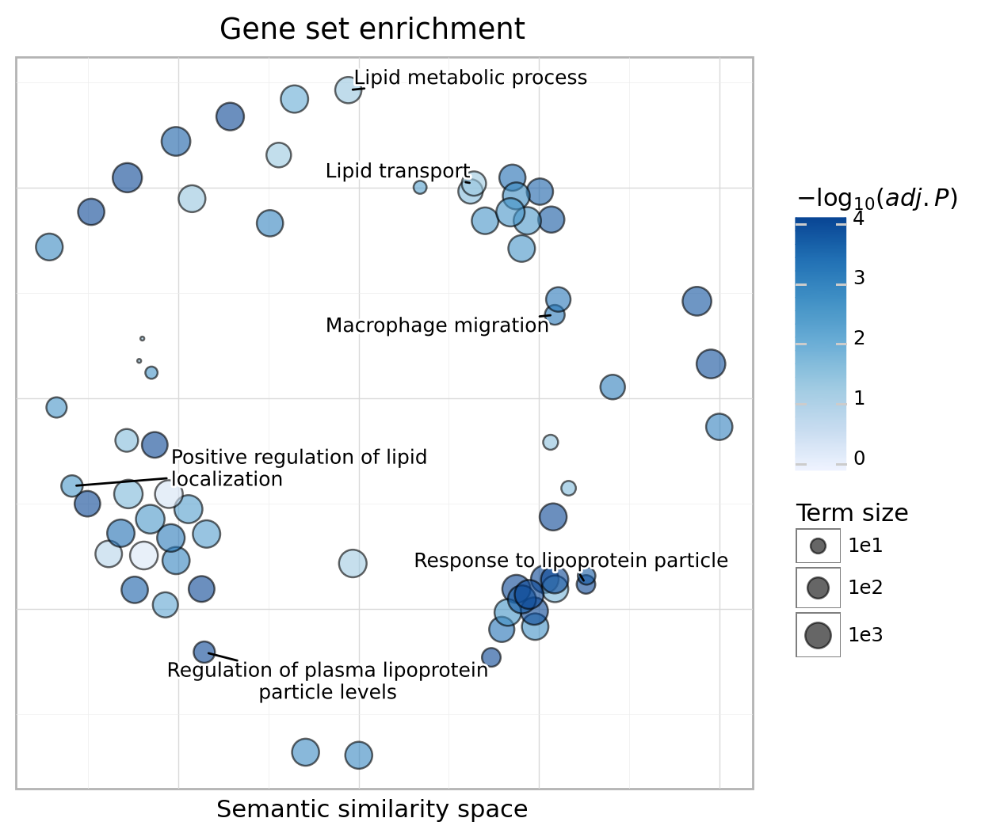

In [77]:
import plotnine as p9
import matplotlib.patheffects as path_effects

pe = [path_effects.Stroke(linewidth=2, foreground='white'), path_effects.Normal()]
lbl_df = rev[(~rev.eliminated) & (rev.dispensability < dispensability_cutoff) & ((rev.name.str.contains('lipid|lipo|macrophage', case=False)) & (~rev.name.str.contains('blood-brain|Cellular response to|Plasma lipoprotein|Lipid localization')))]

g = (
    p9.ggplot(p9.aes(x='plotx', y='ploty'), data=rev) +
    p9.geom_point(p9.aes(fill='neglog10', size='term_size'), color='black', alpha=point_alpha) +
    p9.geom_text(p9.aes(label=text_column), data=lbl_df, size=font_size, ha='center',
                 adjust_text={
                     #'expand_points': expand_points, 
                     'arrowprops': {'arrowstyle': '-'}, 
                     'x':rev.plotx.values,
                     'y':rev.ploty.values,
                 },
                 path_effects=pe) +
    p9.theme_light() +
    p9.scale_fill_distiller(type='seq', palette=palette, direction=1, limits=[0, 4]) +
    p9.labs(x='Semantic similarity space', y='', fill='$-\log_{10}(adj. P)$', size='Term size', title='Gene set enrichment') +
    p9.scale_size_continuous(range=(0.5, 7), trans='log10') +
    p9.theme(figure_size=figure_size,
             axis_text_x=p9.element_blank(),
             axis_text_y=p9.element_blank(),
             axis_ticks=p9.element_blank())
)

ggsave(g, 'figure/SFigure3-1D.pdf')

g

## Bar plot

enrich_df = enrich_df[enrich_df.term_size<1000]

from plotnine import *

en_df = enrich_df[~enrich_df.source.isin(['TF', 'KEGG', 'WP', 'MIRNA', 'HP', 'GO:MF', 'GO:CC'])].copy()
en_df['name'] = en_df['name'].str.capitalize()
en_df['intersections'] = [', '.join(x[:4]) for x in en_df.intersections]
#en_df['name'] = en_df['name'].astype(str) + ' ' + en_df['intersections'].astype(str)

en_df = en_df.drop_duplicates('name')[:16]
en_df['noglog10_pval'] = -np.log10(en_df['p_value'])
en_df['name'] = pd.Categorical(en_df['name'], categories=en_df['name'], ordered=True)

figsize = (5,len(en_df)/4)
text_start = (en_df.noglog10_pval.max()*0.01)

g = (ggplot(en_df, aes(x='name', y='noglog10_pval')) + 
 geom_bar(stat='identity', fill='#EAEAEA') + 
 geom_text(aes(x='name', y=text_start, label='intersections'), size=7, ha='left') +
 coord_flip() + 
 scale_x_discrete(limits=list(reversed(en_df.name.cat.categories))) +
 theme_classic() +
 theme(figure_size=figsize, panel_spacing_x=1., 
      #axis_text_y = element_blank(),
      legend_position = 'none') +
 labs(y='Gene Set Enrichment ($-\log_{10}$(adj. P))', x='', title='LAM gene enrichment'))


display(g)